In [62]:
%cd ~/Desktop/UCLA/UQ_Python/
    
import scipy as sp
import numpy as np
from sklearn.datasets import make_moons
from datasets.Graph_manager import Graph_manager
import matplotlib.pyplot as plt
import random
import os

/Users/Kevin/Desktop/UCLA/UQ_Python


In [2]:
N = 2000
gamma2 = 0.0001
alpha  = 1.0
tau    = 0.1

X, labels = make_moons(N, noise=0.16)
gm = Graph_manager()
graph_params = {
    'knn'    : None,
    'sigma'  : 3.,
    'Ltype'  : 'normed',
    'n_eigs' : N,
    'zp_k'   : None
}

w, v = gm.from_features(X, graph_params, debug=True)

d = (tau ** (2. * alpha)) * ((w + tau**2.) ** (-alpha))
C = v @ sp.sparse.diags(d, format='csr') @ v.T
C_inv = v @ sp.sparse.diags(1./d, format='csr') @ v.T

Compute eigs from scratch



[373, 73, 187, 1040, 265, 1769, 882, 1630, 1058, 1046, 1887, 80, 1602, 76, 436, 1960, 304, 1269, 674, 1798, 711, 55, 817, 138, 1271, 1061, 1543, 745, 829, 517, 1022, 854, 1521, 1068, 1355, 1535, 407, 22, 1976, 1406, 1492, 1584, 1065, 1538, 1412, 93, 176, 831, 853, 1946]


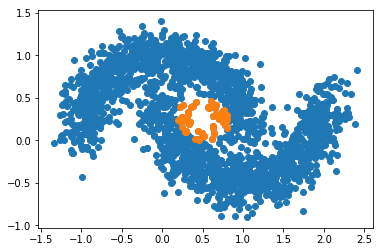

In [4]:
def v_risk(C_inv, labeled, gamma2):
    """
    calculate the risk of each unlabeled point
    """
    N = C_inv.shape[0]
    unlabeled = list(filter(lambda x: x not in labeled, range(N)))
    B_diag = [1 if i in labeled else 0 for i in range(N)]
    B = sp.sparse.diags(B_diag, format='csr')
    C = sp.linalg.inv(C_inv + B/gamma2)
    return np.sum(C.diagonal()[unlabeled]), C

def V_opt(C, unlabeled, gamma2):
    ips = np.array([np.inner(C[k,:], C[k,:]) for k in unlabeled]).flatten()
    v_opt = ips/(gamma2 + np.diag(C)[unlabeled])
    v_opt = (v_opt - min(v_opt))/(max(v_opt) - min(v_opt))
    colors = [(x, 0.5,(1-x)) for x in v_opt]
    plt.scatter(X[unlabeled, 0],X[unlabeled,1], c=colors)
    plt.show()
    k_max = unlabeled[np.argmax(v_opt)]
    return k_max

def Sigma_opt(C, unlabeled, gamma2):
    sums = np.sum(C[np.ix_(unlabeled,unlabeled)], axis=1)
    sums = np.asarray(sums).flatten()**2.
    s_opt = sums/(gamma2 + np.diag(C)[unlabeled])
    k_max = unlabeled[np.argmax(s_opt)]
    return k_max


C = v @ sp.sparse.diags(d, format='csr') @ v.T   
labeled = [np.argmax(C.diagonal())]
labeled = list(np.argsort(C.diagonal())[-20:])
_, C = v_risk(C_inv, labeled, gamma2)
for i in range(30):
    unlabeled = list(filter(lambda x: x not in labeled, range(N)))
    k = V_opt(C, unlabeled, gamma2)
    
    # update posterior and labeled node list
    labeled += [k]
    ck = C[k,:]
    ckk = ck[k]
    C -= (1./(gamma2 + ckk)) * np.outer(ck,ck)
    #evals = sp.linalg.eigvals(C)
    #plt.plot(range(N), evals)
    #plt.show()
    
    
print()
plt.scatter(X[:, 0],X[:, 1])
plt.scatter(X[labeled, 0], X[labeled, 1])
print(labeled)

# Video for ATC

In [6]:
def V_opt_record(C, unlabeled, gamma2):
    ips = np.array([np.inner(C[k,:], C[k,:]) for k in unlabeled]).flatten()
    v_opt = ips/(gamma2 + np.diag(C)[unlabeled])
    k_max = unlabeled[np.argmax(v_opt)]
    return k_max, v_opt

def Sigma_opt_record(C, unlabeled, gamma2):
    sums = np.sum(C[np.ix_(unlabeled,unlabeled)], axis=1)
    sums = np.asarray(sums).flatten()**2.
    s_opt = sums/(gamma2 + np.diag(C)[unlabeled])
    k_max = unlabeled[np.argmax(s_opt)]
    return k_max, s_opt

In [63]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

In [68]:
cd Desktop/UCLA/UQ_Python/notebook_scripts/

/Users/Kevin/Desktop/UCLA/UQ_Python/notebook_scripts


Compute eigs from scratch


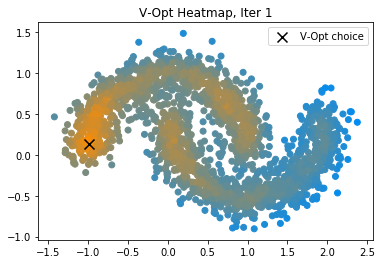

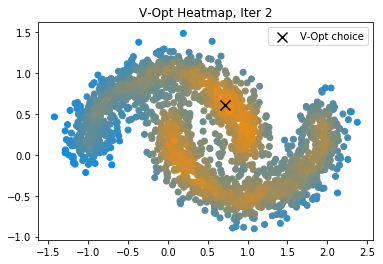

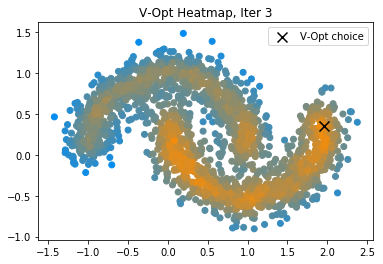

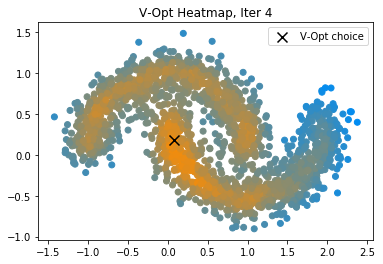

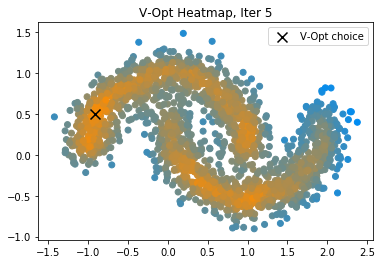

...

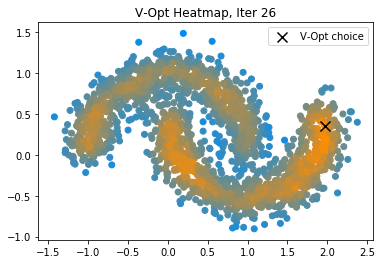

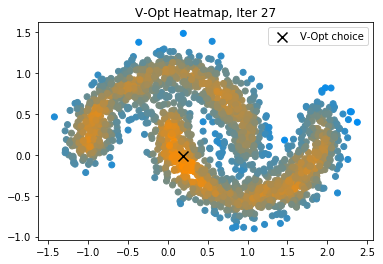

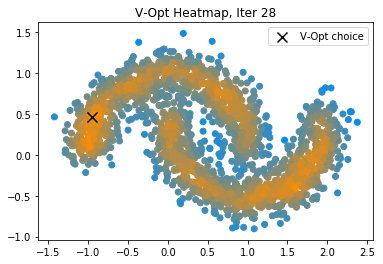

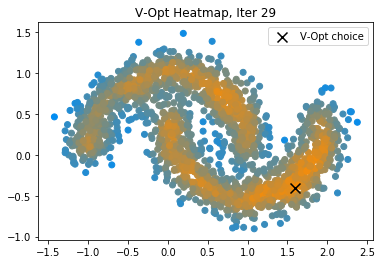

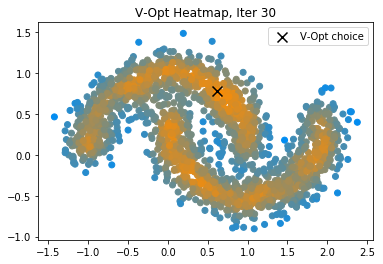

In [140]:
# Run V-Opt pdf sequence

knn_ = 50
if knn_ is not None:
    f_name = 'vopt_%s' % str(knn_)
else:
    f_name = 'voptfull'

if not os.path.exists('./images/%s' % f_name):
    os.makedirs('./images/%s' % f_name)



N = 2000
gamma2 = 0.0001
alpha  = 1.0
tau    = 0.01

X, labels = make_moons(N, noise=0.16)
gm = Graph_manager()
graph_params = {
    'knn'    : knn_,
    'sigma'  : 3.,
    'Ltype'  : 'normed',
    'n_eigs' : N,
    'zp_k'   : None
}

w, v = gm.from_features(X, graph_params, debug=True)

d = (tau ** (2. * alpha)) * ((w + tau**2.) ** (-alpha))
Ct = v @ sp.sparse.diags(d, format='csr') @ v.T
Ct_inv = v @ sp.sparse.diags(1./d, format='csr') @ v.T

#labeled = [np.argmax(Ct.diagonal())]
#labeled = list(np.argsort(Ct.diagonal())[-20:])
n_start = 5
labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
while sum(labels[labeled]) == n_start or sum(labels[labeled]) == 0:
    print('Rechoosing to get both clusters')
    labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
    
_, C = v_risk(Ct_inv, labeled, gamma2)

# Active Learning -- Vopt
VOPTS = []
UNLABELED = []
ks = []

for i in range(30):
    unlabeled = list(filter(lambda x: x not in labeled, range(N)))
    #k = V_opt(C, unlabeled, gamma2)
    k, vopts = V_opt_record(C, unlabeled, gamma2)
    VOPTS.append(vopts)
    UNLABELED.append(unlabeled)
    ks.append(k)
    
    # update posterior and labeled node list
    labeled += [k]
    ck = C[k,:]
    ckk = ck[k]
    C -= (1./(gamma2 + ckk)) * np.outer(ck,ck)
    #evals = sp.linalg.eigvals(C)
    #plt.plot(range(N), evals)
    #plt.show()



#maxv, minv = max([max(vopt) for vopt in VOPTS]), min([min(vopt) for vopt in VOPTS])
#diff = maxv - minv
for i, vopt in enumerate(VOPTS):
    unl = UNLABELED[i]
    #vopt = (vopt - minv)/diff
    vopt = (vopt - min(vopt))/(max(vopt) - min(vopt))
    colors = [(x, 0.55,0.95*(1-x)) for x in vopt]
    plt.scatter(X[unl, 0],X[unl,1], c=colors)
    plt.scatter(X[ks[i],0], X[ks[i],1], c='k', marker='x', s=100, label='V-Opt choice')
    plt.title('V-Opt Heatmap, Iter %d' % (i+1))
    plt.legend()
    plt.savefig('./images/%s/%s-%d.pdf'%(f_name, f_name, i))
    plt.show()
    
    
    
#print()
#plt.scatter(X[:, 0],X[:, 1])
#plt.scatter(X[labeled, 0], X[labeled, 1])
#plt.show()
#print(labeled)

# Sigma Opt Runs

Compute eigs from scratch
Rechoosing to get both clusters


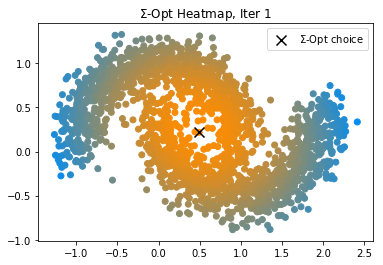

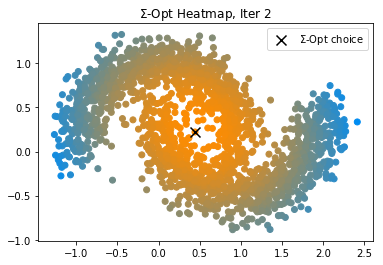

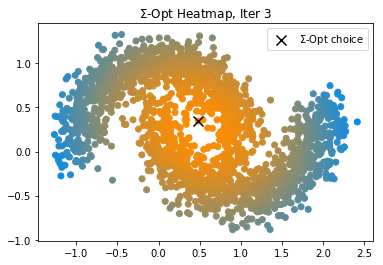

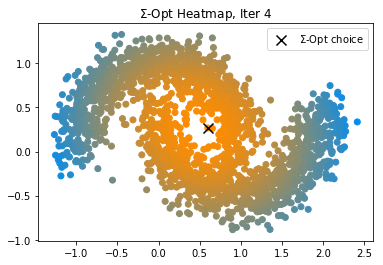

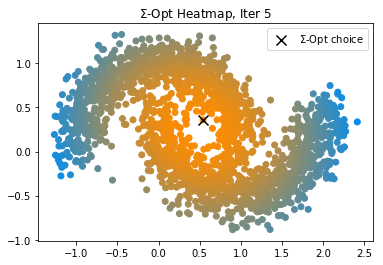

...

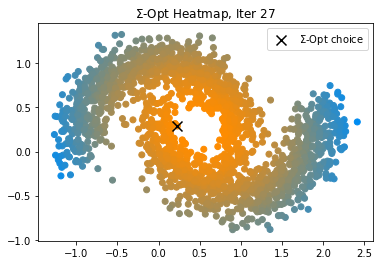

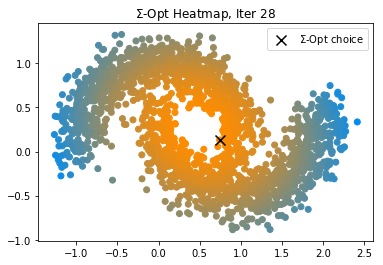

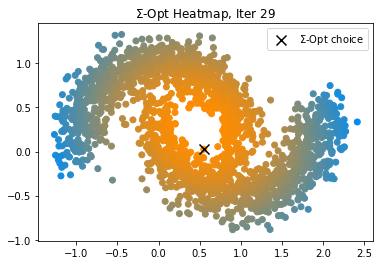

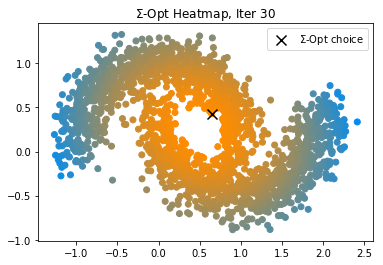

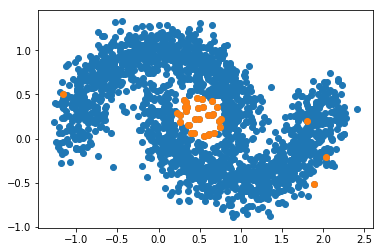

[1912, 802, 1020, 332, 1750, 1048, 815, 1895, 1147, 1493, 951, 238, 1392, 1979, 534, 889, 557, 1079, 1175, 0, 1692, 739, 458, 1775, 294, 232, 890, 730, 1844, 835, 1634, 925, 858, 902, 1782]


In [139]:
knn_ = None
if knn_ is not None:
    f_name = 'sopt_%s' % str(knn_)
else:
    f_name = 'soptfull'

if not os.path.exists('./images/%s' % f_name):
    os.makedirs('./images/%s' % f_name)

N = 2000
gamma2 = 0.0001
alpha  = 1.0
tau    = 0.1

X, labels = make_moons(N, noise=0.16)
gm = Graph_manager()
graph_params = {
    'knn'    : knn_,
    'sigma'  : 3.,
    'Ltype'  : 'normed',
    'n_eigs' : N,
    'zp_k'   : None
}

w, v = gm.from_features(X, graph_params, debug=True)

d = (tau ** (2. * alpha)) * ((w + tau**2.) ** (-alpha))
Ct = v @ sp.sparse.diags(d, format='csr') @ v.T
Ct_inv = v @ sp.sparse.diags(1./d, format='csr') @ v.T

#labeled = [np.argmax(Ct.diagonal())]
#labeled = list(np.argsort(Ct.diagonal())[-20:])
n_start = 5
labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
while sum(labels[labeled]) == n_start or sum(labels[labeled]) == 0:
    print('Rechoosing to get both clusters')
    labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
    
_, C = v_risk(Ct_inv, labeled, gamma2)

# Active Learning -- Sopt
SOPTS = []
UNLABELED = []
ks = []

for i in range(30):
    unlabeled = list(filter(lambda x: x not in labeled, range(N)))
    #k = V_opt(C, unlabeled, gamma2)
    k, sopts = Sigma_opt_record(C, unlabeled, gamma2)
    SOPTS.append(sopts)
    UNLABELED.append(unlabeled)
    ks.append(k)
    
    # update posterior and labeled node list
    labeled += [k]
    ck = C[k,:]
    ckk = ck[k]
    C -= (1./(gamma2 + ckk)) * np.outer(ck,ck)
    #evals = sp.linalg.eigvals(C)
    #plt.plot(range(N), evals)
    #plt.show()



#maxs, mins = max([max(sopt) for sopt in SOPTS]), min([min(sopt) for sopt in SOPTS])
#diff = maxs - mins

for i, sopt in enumerate(SOPTS):
    unl = UNLABELED[i]
    sopt = (sopt - min(sopt))/(max(sopt) - min(sopt))
    colors = [(x, 0.55,0.95*(1-x)) for x in sopt]
    plt.scatter(X[unl, 0],X[unl,1], c=colors)
    plt.scatter(X[ks[i],0], X[ks[i],1], c='k', marker='x', s=100, label=r'$\Sigma$-Opt choice')
    plt.title(r'$\Sigma$-Opt Heatmap, Iter %d' % (i+1))
    plt.legend()
    plt.savefig('./images/%s/%s-%d.pdf'%(f_name, f_name, i))
    plt.show()
    
    
    
print()
plt.scatter(X[:, 0],X[:, 1])
plt.scatter(X[labeled, 0], X[labeled, 1])
plt.show()
print(labeled)

# EEM demo

In [146]:
def calc_next_m(m, C, y, lab, k, y_k, gamma2):
    ck = C[k,:]
    ckk = ck[k]
    ip = np.dot(ck[lab], y[lab])
    val = ((gamma2)*y_k -ip )/(gamma2*(gamma2 + ckk))
    m_k = m + val*ck
    return m_k

def get_probs(m, sigmoid=False):
    if sigmoid:
        return 1./(1. + np.exp(-3.*m))
    m_probs = m.copy()
    # simple fix to get probabilities that respect the 0 threshold
    m_probs[np.where(m_probs >0)] /= 2.*np.max(m_probs)
    m_probs[np.where(m_probs <0)] /= -2.*np.min(m_probs)
    m_probs += 0.5
    return m_probs

def EEM_full(k, m, C, y, lab, unlab, m_probs, gamma2):
    N = C.shape[0]
    m_at_k = m_probs[k]
    m_k_p1 = calc_next_m(m, C, y, lab, k, 1., gamma2)
    m_k_p1 = get_probs(m_k_p1)
    risk = m_at_k*np.sum([min(m_k_p1[i], 1.- m_k_p1[i]) for i in range(N)])
    m_k_m1 = calc_next_m(m, C, y, lab, k, -1., gamma2)
    m_k_m1 = get_probs(m_k_m1)
    risk += (1.-m_at_k)*np.sum([min(m_k_m1[i], 1.- m_k_m1[i]) for i in range(N)])
    return risk

def EEM_opt_record(m, C, y, labeled, unlabeled, gamma2):
    m_probs = get_probs(m)
    risks = [EEM_full(j, m, C, y, labeled, unlabeled, m_probs, gamma2) for j in range(N)]
    k = np.argmin(risks)
    return k, risks


In [173]:
knn_ = 15
if knn_ is not None:
    f_name = 'eem_%s' % str(knn_)
else:
    f_name = 'eemfull'

if not os.path.exists('./images/%s' % f_name):
    os.makedirs('./images/%s' % f_name)

N = 1000
gamma2 = 0.0001
alpha  = 1.0
tau    = 0.01

X, labels = make_moons(N, noise=0.16)
labels[labels == 0] = -1
gm = Graph_manager()
graph_params = {
    'knn'    : knn_,
    'sigma'  : 1.,
    'Ltype'  : 'normed',
    'n_eigs' : N,
    'zp_k'   : None
}

w, v = gm.from_features(X, graph_params, debug=True)

d = (tau ** (2. * alpha)) * ((w + tau**2.) ** (-alpha))
Ct = v @ sp.sparse.diags(d, format='csr') @ v.T
Ct_inv = v @ sp.sparse.diags(1./d, format='csr') @ v.T

#labeled = [np.argmax(Ct.diagonal())]
#labeled = list(np.argsort(Ct.diagonal())[-20:])
n_start = 5
labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
while sum(labels[labeled]) == n_start or sum(labels[labeled]) == 0:
    print('Rechoosing to get both clusters')
    labeled = list(np.random.choice(list(range(N)), size=n_start, replace=False))
unlabeled = list(filter(lambda x: x not in labeled, range(N)))
print(labeled)
    
_, C = v_risk(Ct_inv, labeled, gamma2)
m = (C[:,labeled].dot(labels[labeled]))/gamma2 # posterior mean, 
y = labels.copy()
y[unlabeled] = 0

# Active Learning -- EEM
EEM = []
UNLABELED = []
ks = []

for i in range(10):
    unlabeled = list(filter(lambda x: x not in labeled, range(N)))
    k, eem = EEM_opt_record(m, C, y, labeled, unlabeled, gamma2)
    EEM.append(eem)
    UNLABELED.append(unlabeled)
    ks.append(k)
    
    # update posterior covariance, mean, labeled node list
    m = calc_next_m(m, C, y, labeled, k, labels[k], gamma2)
    plt.scatter
    ck = C[k,:]
    ckk = ck[k]
    #ip = np.dot(ck[labeled], y[labeled])
    #val = ((gamma2)*labels[k] - ip )/(gamma2*(gamma2 + ckk))
    #m += val*ck
    C -= (1./(gamma2 + ckk)) * np.outer(ck,ck)
    y[k] = labels[k]
    labeled += [k]



#maxs, mins = max([max(sopt) for sopt in SOPTS]), min([min(sopt) for sopt in SOPTS])
#diff = maxs - mins



Compute eigs from scratch
[843, 180, 702, 881, 202]


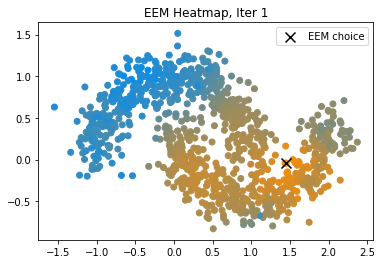

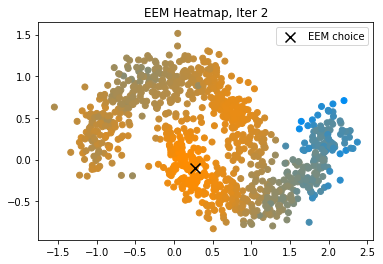

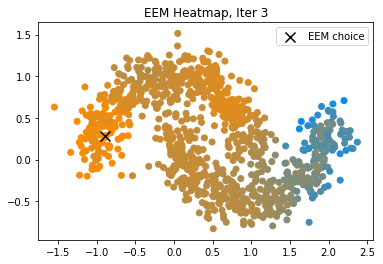

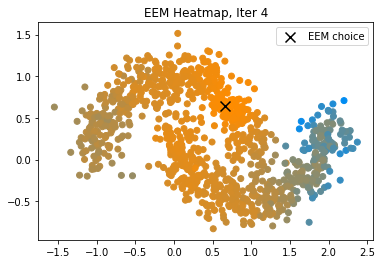

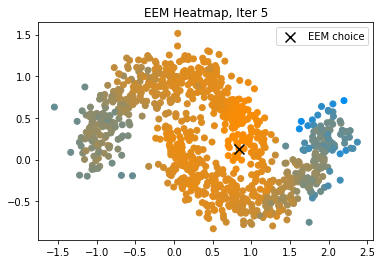

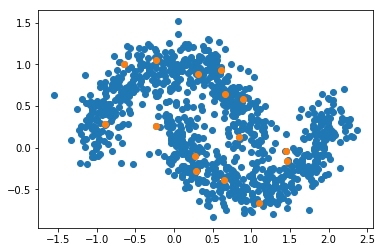

[843, 180, 702, 881, 202, 14, 618, 240, 808, 437, 551, 432, 206, 924, 393]


In [174]:
for i, eem in enumerate(EEM[:5]):
    unl = UNLABELED[i]
    eem = (eem - min(eem))/(max(eem) - min(eem))
    #plt.scatter(range(N), eem, marker='.')
    #plt.show()
    colors = [((1-x), 0.55,0.95*x) for x in eem]
    #plt.scatter(X[unl, 0],X[unl,1], c=colors)
    plt.scatter(X[:, 0],X[:,1], c=colors)
    plt.scatter(X[ks[i],0], X[ks[i],1], c='k', marker='x', s=100, label=r'EEM choice')
    plt.title(r'EEM Heatmap, Iter %d' % (i+1))
    plt.legend()
    plt.savefig('./images/%s/%s-%d.pdf'%(f_name, f_name, i))
    plt.show()
    
    
    
print()
plt.scatter(X[:, 0],X[:, 1])
plt.scatter(X[labeled, 0], X[labeled, 1])
plt.show()
print(labeled)

# To Do

- Get a better EEM video for ATC presentation?
- Run all the tests **on the same** graph?
    - get plots of the accuracy, for comparison?
- Redo the Active learning code, interface with Graph Manager objects, and rewrite methods? 
    - **big undertaking, maybe post ATC?**
